#Introduction



# Phase 1: Set-up

In [ ]:
 !pip install pandas-profiling
 !pip install catboost

In [ ]:
import pandas as pd
import sys
import pandas_profiling as pp
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings

from sklearn import preprocessing
from sklearn.model_selection import train_test_split,cross_val_score, learning_curve
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import confusion_matrix, classification_report, f1_score, accuracy_score, precision_score, recall_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder,LabelEncoder
from scipy.stats import norm, skew
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from keras import models, layers
# Tensforflow libraries
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from tensorflow.keras.optimizers import Adam
from keras.layers import Flatten, Dense, Dropout, BatchNormalization
from keras.layers import Conv1D, MaxPool1D
from imblearn.over_sampling import SMOTE

warnings.filterwarnings('ignore')

<ipython-input-2-b2a06007eab9>:3: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pp


In [ ]:
data=pd.read_csv('Fraud Dataset.csv')
data.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,1,29-01-19 22:05,3.550000e+15,"fraud_Parisian, Schiller and Altenwerth",misc_net,666.70,Cody,Blake,M,300 Hodge Loaf,...,29.7396,-95.4460,2906700,Community development worker,14-03-62,5ea472d933561e36dcad710839b9ed6b,1327874723,29.806815,-95.377033,1
1,2,06-01-19 15:25,3.520000e+15,"fraud_Hagenes, Kohler and Hoppe",food_dining,1.93,Micheal,Walters,M,15315 Vaughn Park Suite 356,...,47.8342,-90.0476,272,Freight forwarder,05-07-01,fb373b76f05670ce23402ace28650dfb,1325863529,46.835966,-89.251001,0
2,3,13-01-19 17:49,3.760000e+14,fraud_Kilback LLC,food_dining,23.03,Rachel,Lowe,F,372 Jeffrey Course,...,41.1558,-101.1360,1789,Insurance broker,11-02-82,06f5d997085b59dda6dbf1ae2ed33b71,1326476990,41.938008,-101.775582,0
3,4,03-04-19 23:48,5.140000e+15,"fraud_Streich, Dietrich and Barton",shopping_net,994.00,Dakota,Fowler,M,16220 Joseph Point Suite 096,...,36.4657,-81.8140,13021,Tree surgeon,17-07-01,db194959b156dee693d5599a2ec54382,1333496912,37.324006,-80.905928,1
4,5,08-01-19 15:12,3.550000e+15,fraud_Kuhic LLC,shopping_net,194.94,Sara,Harris,F,597 Jenny Ford Apt. 543,...,44.2320,-74.4905,6120,Chartered loss adjuster,09-10-76,69bf1ad18f8c2b366ffe8d7d8a55cf29,1326035535,44.126948,-74.685703,0


###Profiling Report

In [ ]:
pp.ProfileReport(data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36000 entries, 0 to 35999
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             36000 non-null  int64  
 1   trans_date_trans_time  36000 non-null  object 
 2   cc_num                 36000 non-null  float64
 3   merchant               36000 non-null  object 
 4   category               36000 non-null  object 
 5   amt                    36000 non-null  float64
 6   first                  36000 non-null  object 
 7   last                   36000 non-null  object 
 8   gender                 36000 non-null  object 
 9   street                 36000 non-null  object 
 10  city                   36000 non-null  object 
 11  state                  36000 non-null  object 
 12  zip                    36000 non-null  int64  
 13  lat                    36000 non-null  float64
 14  long                   36000 non-null  float64
 15  ci

#Phase 2:Data pre-processing

In [ ]:
data.nunique()

Unnamed: 0               36000
trans_date_trans_time    22739
cc_num                     320
merchant                   693
category                    14
amt                      17206
first                      348
last                       479
gender                       2
street                     965
city                       879
state                       51
zip                        952
lat                        950
long                       951
city_pop                   865
job                        493
dob                        950
trans_num                36000
unix_time                35650
merch_lat                35960
merch_long               35981
is_fraud                     2
dtype: int64

### Checking for Null values

In [ ]:
# Check for duplicate rows across all columns
print("Number of NULL values:\n", data.isnull().sum())

Number of NULL values:
 Unnamed: 0               0
trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64


### Checking for Duplicate Rows

In [ ]:
# Check for duplicate rows across all columns
print("Number of Duplicate Rows:", data.duplicated().sum())

Number of Duplicate Rows: 0


### Adding a new features 'Age'

In [ ]:
transaction_date = pd.to_datetime(data['trans_date_trans_time'])
birth_date =  pd.to_datetime(data['dob'])
data['age'] = (birth_date- transaction_date) / np.timedelta64(1, 'Y')
data.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,age
0,1,29-01-19 22:05,3.550000e+15,"fraud_Parisian, Schiller and Altenwerth",misc_net,666.70,Cody,Blake,M,300 Hodge Loaf,...,-95.4460,2906700,Community development worker,14-03-62,5ea472d933561e36dcad710839b9ed6b,1327874723,29.806815,-95.377033,1,-43.119516
1,2,06-01-19 15:25,3.520000e+15,"fraud_Hagenes, Kohler and Hoppe",food_dining,1.93,Micheal,Walters,M,15315 Vaughn Park Suite 356,...,-90.0476,272,Freight forwarder,05-07-01,fb373b76f05670ce23402ace28650dfb,1325863529,46.835966,-89.251001,0,18.069207
2,3,13-01-19 17:49,3.760000e+14,fraud_Kilback LLC,food_dining,23.03,Rachel,Lowe,F,372 Jeffrey Course,...,-101.1360,1789,Insurance broker,11-02-82,06f5d997085b59dda6dbf1ae2ed33b71,1326476990,41.938008,-101.775582,0,36.199901
3,4,03-04-19 23:48,5.140000e+15,"fraud_Streich, Dietrich and Barton",shopping_net,994.00,Dakota,Fowler,M,16220 Joseph Point Suite 096,...,-81.8140,13021,Tree surgeon,17-07-01,db194959b156dee693d5599a2ec54382,1333496912,37.324006,-80.905928,1,17.632098
4,5,08-01-19 15:12,3.550000e+15,fraud_Kuhic LLC,shopping_net,194.94,Sara,Harris,F,597 Jenny Ford Apt. 543,...,-74.4905,6120,Chartered loss adjuster,09-10-76,69bf1ad18f8c2b366ffe8d7d8a55cf29,1326035535,44.126948,-74.685703,0,42.891047


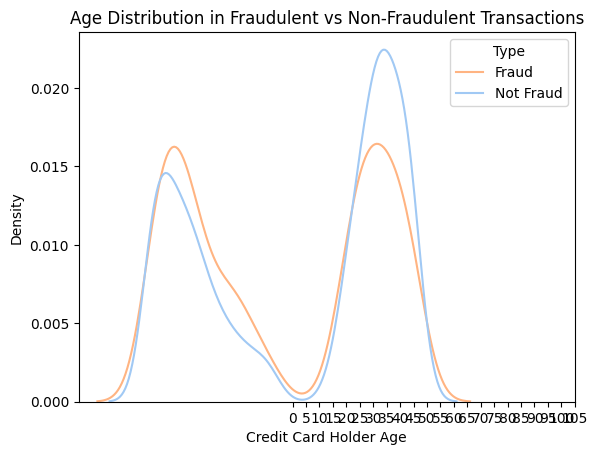

In [ ]:
# Custom palette for "Not Fraud" (blue) and "Fraud" (pink)
pastel_palette = sns.color_palette('pastel')
fraud_palette = {0: pastel_palette[0], 1: pastel_palette[1]}

ax = sns.kdeplot(x='age', data=data, hue='is_fraud', common_norm=False, palette=fraud_palette)
ax.set_xlabel('Credit Card Holder Age')
ax.set_ylabel('Density')
plt.xticks(np.arange(0, 110, 5))
plt.title('Age Distribution in Fraudulent vs Non-Fraudulent Transactions')
plt.legend(title='Type', labels=[ 'Fraud','Not Fraud'])

plt.show()


### Drop unnecessary features

In [ ]:
#columns_to_drop = ["Unnamed: 0", "cc_num"]
columns_to_drop = ["Unnamed: 0","first","last","trans_num","cc_num"]
data.drop(columns=columns_to_drop, axis=1, inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36000 entries, 0 to 35999
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   trans_date_trans_time  36000 non-null  object 
 1   merchant               36000 non-null  object 
 2   category               36000 non-null  object 
 3   amt                    36000 non-null  float64
 4   gender                 36000 non-null  object 
 5   street                 36000 non-null  object 
 6   city                   36000 non-null  object 
 7   state                  36000 non-null  object 
 8   zip                    36000 non-null  int64  
 9   lat                    36000 non-null  float64
 10  long                   36000 non-null  float64
 11  city_pop               36000 non-null  int64  
 12  job                    36000 non-null  object 
 13  dob                    36000 non-null  object 
 14  unix_time              36000 non-null  int64  
 15  me

### Corrlation Matrix between all features

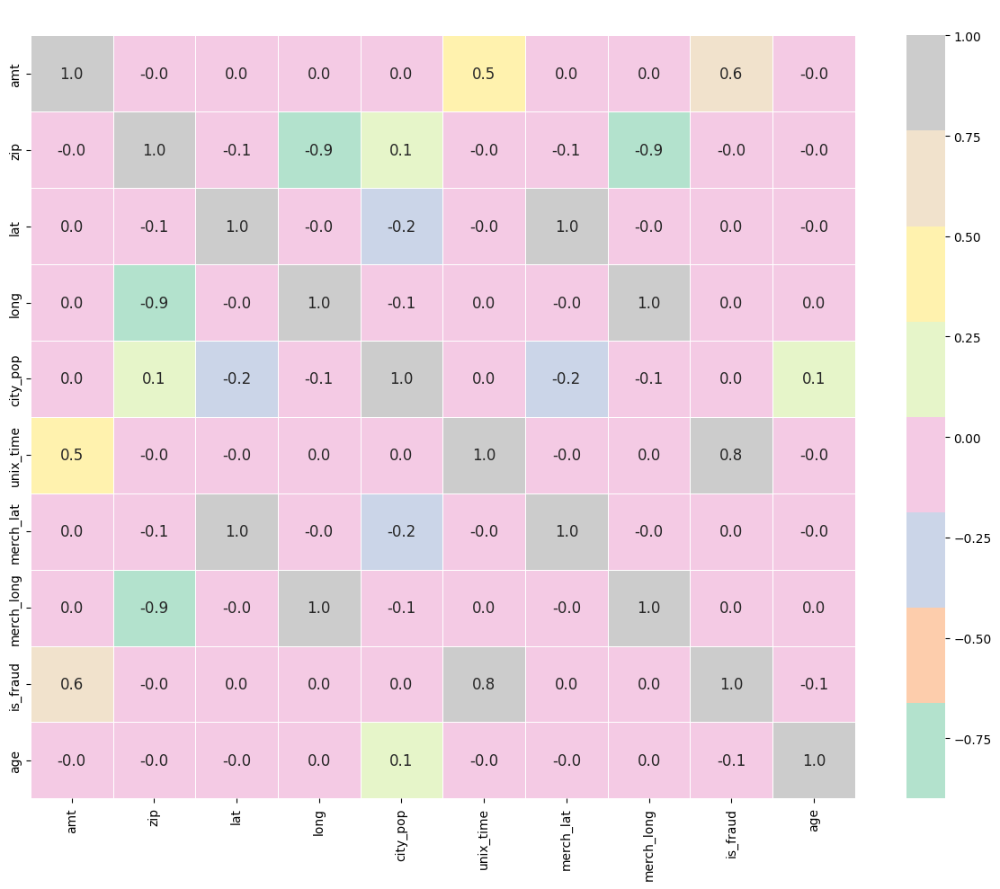

In [ ]:
# Calculate the correlation matrix
corr = data.corr().round(1)

plt.figure(figsize=(12, 10))
ax=sns.heatmap(corr, annot=True, cmap='Pastel2', fmt='.1f', linewidths=0.5, annot_kws={"size": 12})
plt.title("Credit Card Fraud - Correlation Heatmap", color="white", size=20)
plt.tight_layout()
plt.show()


### Number of Fraud and Not-Fraud Cases

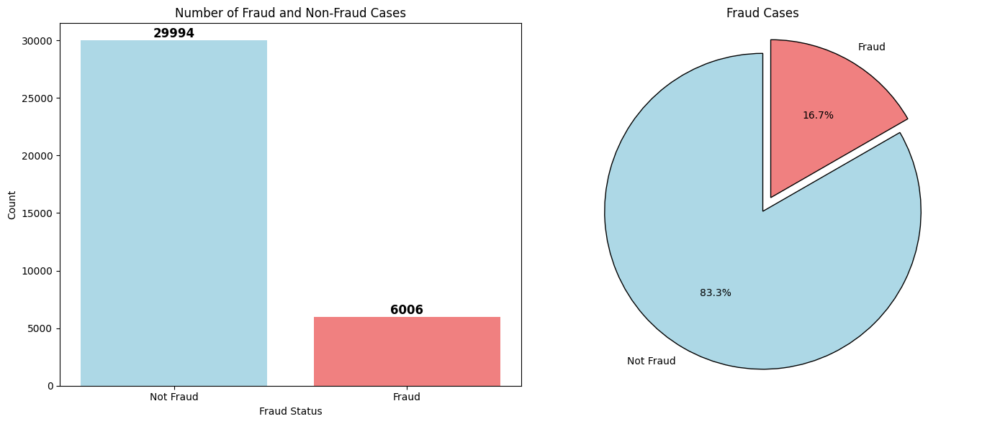

In [ ]:
# Count the number of fraud cases
fraud_counts = data["is_fraud"].value_counts()
fraud_labels = fraud_counts.index.tolist()
fraud_values = fraud_counts.tolist()

# Create a figure with one row and two columns for side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot the bar chart on the first subplot (axes[0])
axes[0].bar(['Not Fraud', 'Fraud'], fraud_values, color=['lightblue', 'lightcoral'])
for i, v in enumerate(fraud_values):
    axes[0].text(i, v, str(v), ha='center', va='bottom', fontweight='bold', fontsize=12)

axes[0].set_title('Number of Fraud and Non-Fraud Cases')
axes[0].set_xlabel('Fraud Status')
axes[0].set_ylabel('Count')

# Create a pie chart on the second subplot (axes[1])
axes[1].pie(fraud_values, labels=['Not Fraud', 'Fraud'], autopct='%1.1f%%', startangle=90,explode = (0.1,0), colors=['lightblue', 'lightcoral'],
            wedgeprops={'edgecolor': 'black', 'linewidth': 1, 'antialiased': True})
axes[1].set_title('Fraud Cases')
axes[1].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Adjust the layout and display the plots
plt.tight_layout()
plt.show()


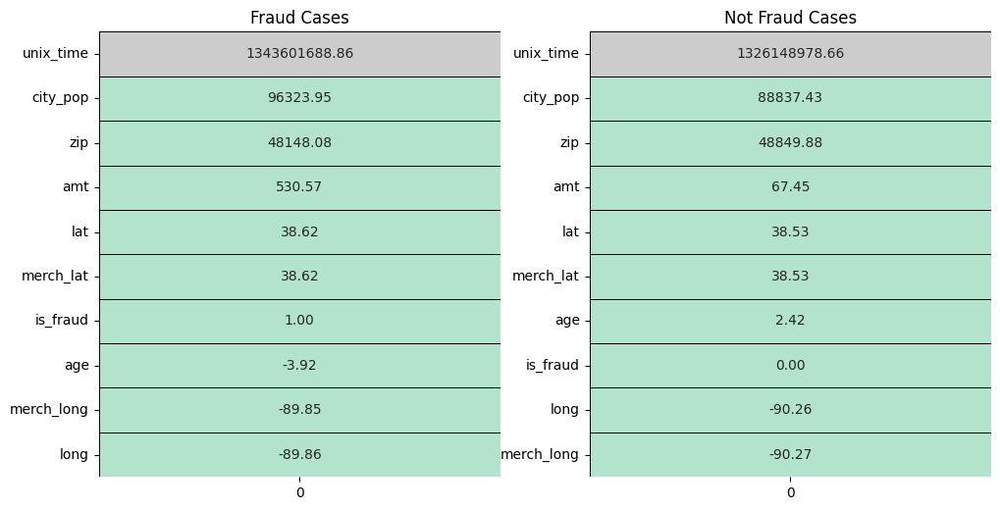

In [ ]:
# Sort the mean values in descending order for 'is_fraud' = 1 (fraud) and 'is_fraud' = 0 (not fraud)
fraud_mean = data[data['is_fraud'] == 1].mean().sort_values(ascending=False)
not_fraud_mean = data[data['is_fraud'] == 0].mean().sort_values(ascending=False)

# Create subplots with 1 row and 2 columns
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

# Plot heatmap for 'is_fraud' = 1 (fraud)
plt.subplot(1, 2, 1)
sns.heatmap(fraud_mean.to_frame(), annot=True, cmap='Pastel2', linewidths=0.4, linecolor='black', cbar=False, fmt='.2f')
plt.title('Fraud Cases')

plt.subplot(1, 2, 2)
sns.heatmap(not_fraud_mean.to_frame(), annot=True, cmap='Pastel2', linewidths=0.4, linecolor='black', cbar=False, fmt='.2f')
plt.title('Not Fraud Cases')
fig.tight_layout(pad=0)
plt.show()

In [ ]:
# Get the names of categorical features
categorical_features = data.select_dtypes(include='object').columns.tolist()

# Get the names of numerical features
numerical_features = data.select_dtypes(include=['int64', 'float64']).columns.tolist()

print("Categorical Features:", categorical_features)
print("Numerical Features:", numerical_features)

Categorical Features: ['trans_date_trans_time', 'merchant', 'category', 'gender', 'street', 'city', 'state', 'job', 'dob']
Numerical Features: ['amt', 'zip', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long', 'is_fraud', 'age']


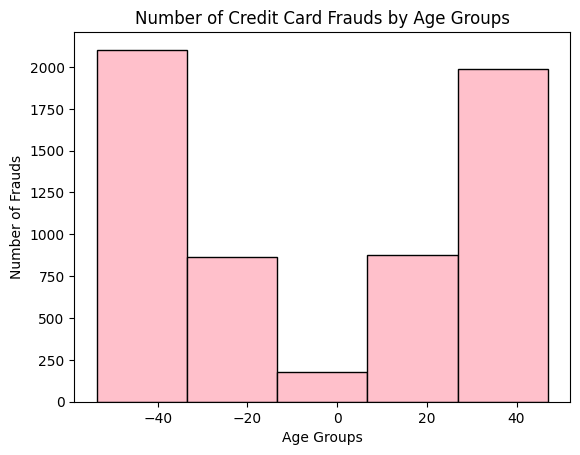

In [ ]:
import matplotlib.pyplot as plt

# Filter the DataFrame to include only fraud cases (where "is_fraud" is 1)
fraud = data[data["is_fraud"] == 1]

# Create a histogram for the "age" column of fraud cases
fig, ax = plt.subplots()
ax.hist(fraud["age"], edgecolor="black", bins=5, color='pink')

plt.title("Number of Credit Card Frauds by Age Groups")
plt.xlabel("Age Groups")
plt.ylabel("Number of Frauds")
plt.show()


Finding the Outliers

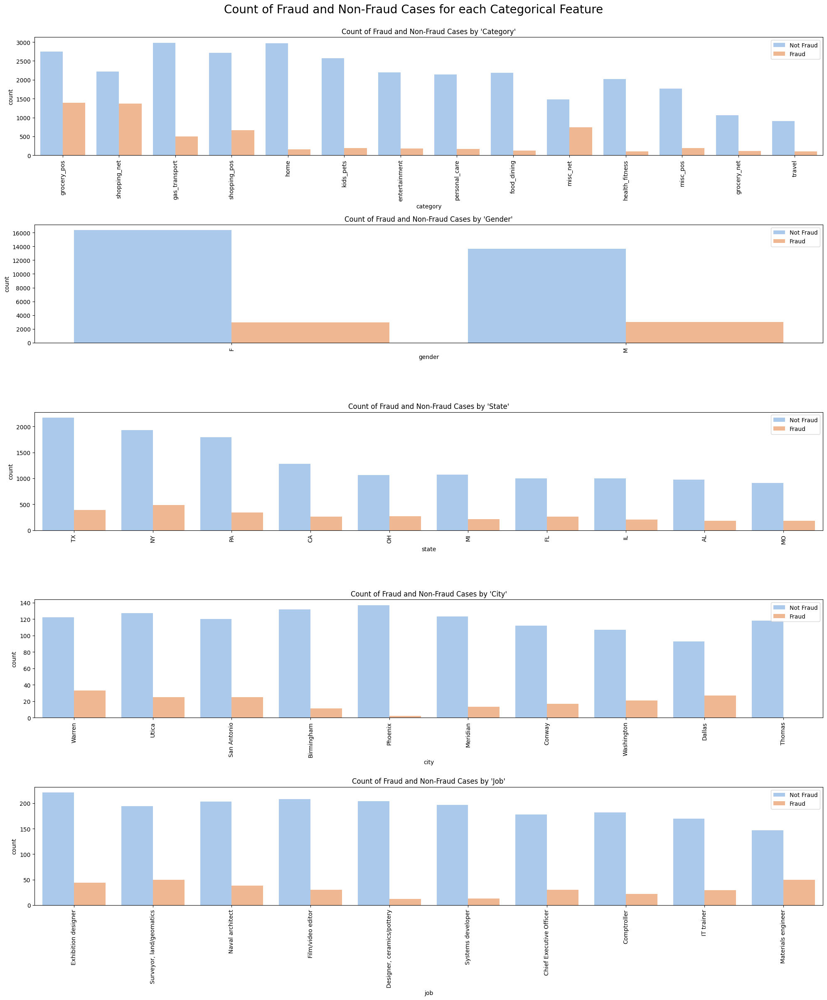

In [ ]:
pastel_palette = sns.color_palette('pastel')

# Create subplots with 5 rows and 1 column
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(20, 24))
fig.suptitle("Count of Fraud and Non-Fraud Cases for each Categorical Feature", y=1, size=20)

# List of categorical features and their respective top 10 categories
categorical_features = {
    'category': data["category"].value_counts(sort=True, ascending=False).index,
    'gender': data["gender"].value_counts(sort=True, ascending=False).index,
    'state': data["state"].value_counts(sort=True, ascending=False).head(10).index,
    'city': data["city"].value_counts(sort=True, ascending=False).head(10).index,
    'job': data["job"].value_counts(sort=True, ascending=False).head(10).index
}

# Iterate through the categorical features
for i, (feature, top_categories) in enumerate(categorical_features.items()):
    # Plot the count of Fraud and Non-Fraud cases for each category
    sns.countplot(data=data, x=feature, hue='is_fraud', order=top_categories, palette=pastel_palette, ax=axes[i])
    axes[i].set_title(f"Count of Fraud and Non-Fraud Cases by '{feature.capitalize()}'")
    axes[i].tick_params(axis='x', rotation=90)
    axes[i].legend(labels=['Not Fraud', 'Fraud'])

# Adjust the layout to avoid overlapping titles and labels
plt.tight_layout()
plt.show()


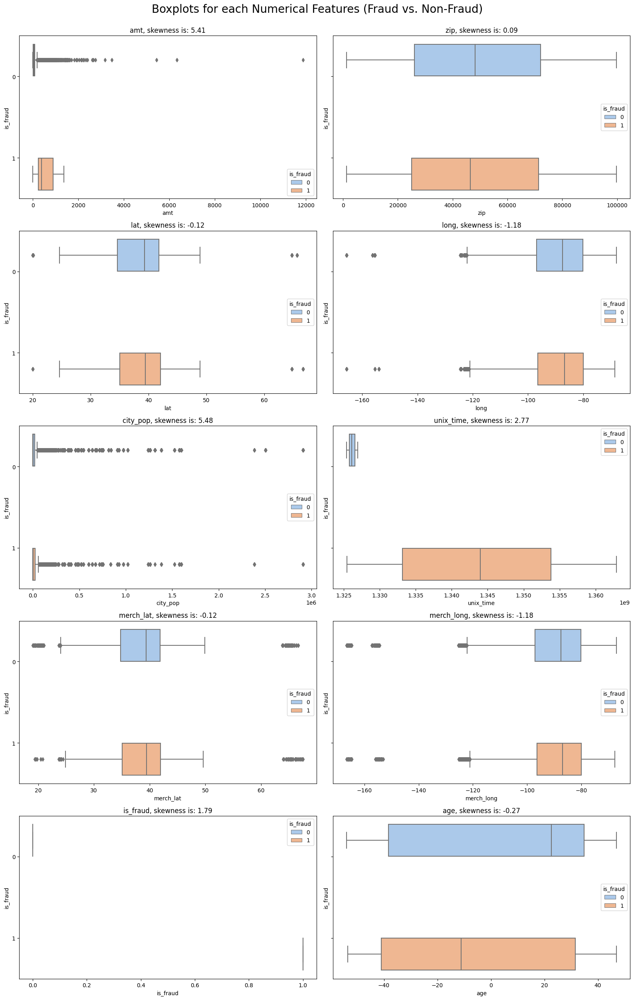

In [ ]:
pastel_palette = sns.color_palette('pastel')

# Create a function for custom boxplots
def boxplots_custom(dataset, columns_list, rows, cols, suptitle):
    fig, axs = plt.subplots(rows, cols, sharey=True, figsize=(16, 25))
    fig.suptitle(suptitle, y=1, size=20)
    axs = axs.flatten()

    # Custom palette for "Not Fraud" (blue) and "Fraud" (pink)
    fraud_palette = {0: pastel_palette[0], 1: pastel_palette[1]}

    for i, da in enumerate(columns_list):
        axs[i].legend(['Not Fraud', 'Fraud'])  # Add legend labels
        sns.boxplot(data=dataset, x=da, y='is_fraud', hue='is_fraud', orient='h', ax=axs[i], palette=fraud_palette)
        axs[i].set_title(da + ', skewness is: ' + str(round(dataset[da].skew(axis=0, skipna=True), 2)))

# Call the function for the 'data' DataFrame, 'numerical_features' list, 5 rows, 2 columns, and title
boxplots_custom(data, numerical_features, 5, 2, 'Boxplots for each Numerical Features (Fraud vs. Non-Fraud)')

# Adjust the layout to avoid overlapping titles and labels
plt.tight_layout()
plt.show()


#Phase 3: Data Modeling and Prediction

###Spliting Data

In [ ]:
X = data.drop('is_fraud', axis=1)
y = data['is_fraud']

###Encoding

In [ ]:
label_encoder = LabelEncoder()
for column in X.columns:
    if X[column].dtype == 'object':  # Encode only object (categorical) columns
        X[column + '_encoded'] = label_encoder.fit_transform(X[column])
        X.drop(column, axis=1, inplace=True)

X

,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,age,trans_date_trans_time_encoded,merchant_encoded,category_encoded,gender_encoded,street_encoded,city_encoded,state_encoded,job_encoded,dob_encoded
0,666.70,77027,29.7396,-95.4460,2906700,1327874723,29.806815,-95.377033,-43.119516,22215,475,8,1,302,352,43,98,398
1,1.93,55606,47.8342,-90.0476,272,1325863529,46.835966,-89.251001,18.069207,5735,219,1,1,144,353,23,202,136
2,23.03,69165,41.1558,-101.1360,1789,1326476990,41.938008,-101.775582,36.199901,13825,316,1,0,377,774,29,247,296
3,994.00,37683,36.4657,-81.8140,13021,1333496912,37.324006,-80.905928,17.632098,3217,604,11,1,151,535,42,481,509
4,194.94,12986,44.2320,-74.4905,6120,1326035535,44.126948,-74.685703,42.891047,8251,346,11,0,592,797,34,70,266
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35995,61.33,54559,46.4959,-90.4383,795,1326580388,46.279362,-90.204531,32.753416,15383,368,1,1,693,718,48,460,448
35996,1115.67,47838,38.9763,-87.3667,4081,1345327207,38.967435,-86.481448,-18.571451,20149,480,12,1,488,119,15,151,442
35997,77.50,15217,40.4308,-79.9205,687276,1326348538,39.611076,-79.203326,46.118005,13060,117,2,1,525,634,38,411,594
35998,3.92,30009,34.0770,-84.3033,165556,1325944977,33.749698,-83.454033,21.510598,6884,67,12,0,904,12,10,351,830


###OverSampling

In [ ]:
# Apply SMOTE to generate synthetic samples for the minority class
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)


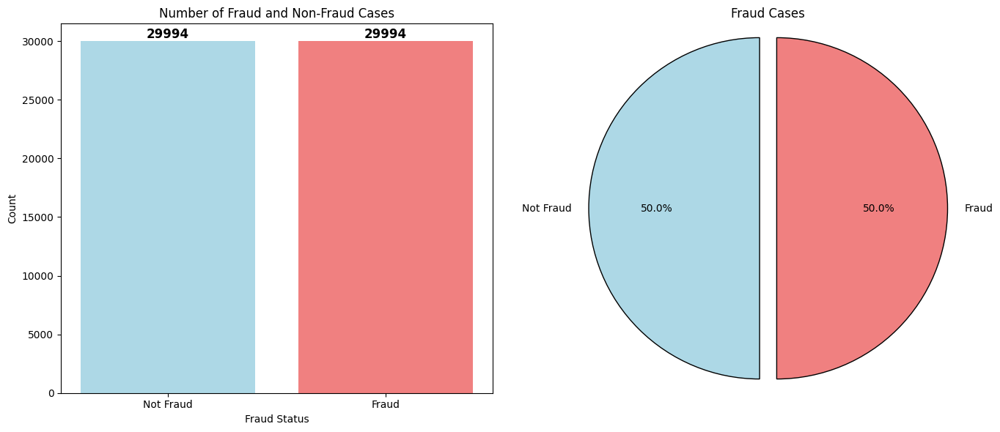

In [ ]:
# Count the number of fraud cases
fraud_counts = y_resampled.value_counts()
fraud_labels = fraud_counts.index.tolist()
fraud_values = fraud_counts.tolist()

# Create a figure with one row and two columns for side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot the bar chart on the first subplot (axes[0])
axes[0].bar(['Not Fraud', 'Fraud'], fraud_values, color=['lightblue', 'lightcoral'])
for i, v in enumerate(fraud_values):
    axes[0].text(i, v, str(v), ha='center', va='bottom', fontweight='bold', fontsize=12)

axes[0].set_title('Number of Fraud and Non-Fraud Cases')
axes[0].set_xlabel('Fraud Status')
axes[0].set_ylabel('Count')

# Create a pie chart on the second subplot (axes[1])
axes[1].pie(fraud_values, labels=['Not Fraud', 'Fraud'], autopct='%1.1f%%', startangle=90,explode = (0.1,0), colors=['lightblue', 'lightcoral'],
            wedgeprops={'edgecolor': 'black', 'linewidth': 1, 'antialiased': True})
axes[1].set_title('Fraud Cases')
axes[1].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Adjust the layout and display the plots
plt.tight_layout()
plt.show()

###Scaling

In [ ]:
# Select the numerical columns
numerical_columns = X_resampled.select_dtypes(include=[float, int]).columns

# Create a scaler object
scaler = StandardScaler()

# Scale numerical columns
X_resampled[numerical_columns] = scaler.fit_transform(X_resampled[numerical_columns])
X_resampled

,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,age,trans_date_trans_time_encoded,merchant_encoded,category_encoded,gender_encoded,street_encoded,city_encoded,state_encoded,job_encoded,dob_encoded
0,1.050648,1.069242,-1.741617,-0.391753,9.317251,-0.597842,-1.716217,-0.386496,-1.180130,1.386151,0.725142,0.387795,1.110043,-0.671627,-0.342890,1.167856,-1.126783,-0.243129
1,-0.851194,0.268937,1.820715,-0.003397,-0.305104,-0.769308,1.614927,0.053635,0.523782,-1.002595,-0.668558,-1.533476,1.110043,-1.252285,-0.338885,-0.251710,-0.360544,-1.214682
2,-0.790829,0.775512,0.505921,-0.801086,-0.300082,-0.717006,0.656817,-0.846208,1.028664,0.170035,-0.140476,-1.533476,-0.900866,-0.395998,1.347202,0.174160,-0.028998,-0.621367
3,1.987021,-0.400680,-0.417432,0.588921,-0.262896,-0.118518,-0.245748,0.653197,0.511610,-1.367575,1.427436,1.211196,1.110043,-1.226560,0.390017,1.096877,1.695040,0.168483
4,-0.299011,-1.323379,1.111540,1.115767,-0.285743,-0.754643,1.085005,1.100096,1.214991,-0.637906,0.022848,1.211196,-0.900866,0.394139,1.439316,0.529051,-1.333078,-0.732614
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59983,-0.193536,1.746257,-0.247196,-2.287009,2.918132,0.413641,-0.096790,-2.291815,0.644518,0.663149,-0.902656,-0.435607,-0.900866,-0.822304,1.106905,-1.600297,-0.264764,0.238939
59984,0.093887,0.264043,1.083874,-0.139563,-0.303161,1.546260,1.010846,-0.098962,-0.474206,0.758090,0.066401,-0.710075,1.110043,0.243462,-0.971668,0.316116,-0.765766,0.572679
59985,1.877957,0.059754,0.272172,0.295876,-0.289133,0.720726,0.077343,0.298994,-0.578430,1.312517,0.866690,1.211196,1.110043,1.165900,0.257854,0.387095,1.282449,0.999124
59986,0.743431,-0.722020,-1.192744,0.596563,-0.304773,0.384472,-1.191132,0.561575,0.891888,-0.069274,-0.766553,-0.161140,-0.900866,-1.211860,0.474121,-1.032471,1.370862,0.758090


###Split data to Train & Test

In [ ]:
# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

###Apllying PCA

In [ ]:
# Create a PCA object
pca = PCA(n_components=2)  # You can choose the number of components based on your requirements.

# Fit and transform the training data
x_train_pca = pca.fit_transform(x_train)

# Transform the test data
x_test_pca = pca.transform(x_test)


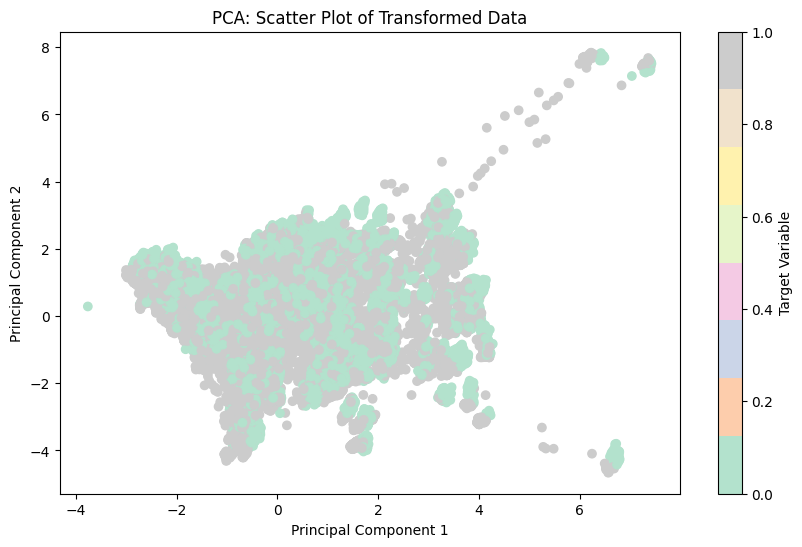

In [ ]:
# Create a scatter plot for the first two principal components
plt.figure(figsize=(10, 6))
plt.scatter(x_train_pca[:,0], x_train_pca[:,1], c=y_train, cmap='Pastel2')
plt.colorbar(label='Target Variable')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA: Scatter Plot of Transformed Data')
plt.show()


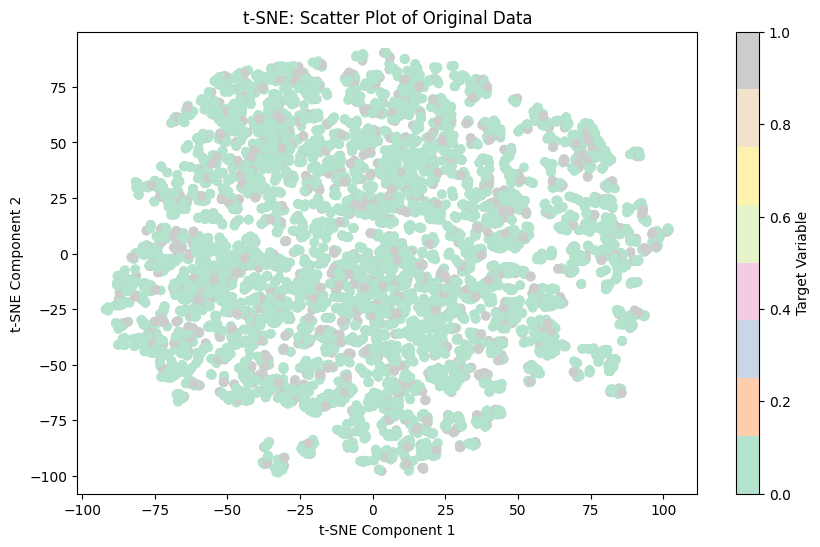

In [28]:
# Apply t-SNE to reduce dimensions for visualization
tsne = TSNE(n_components=2, random_state=42)
data_tsne = tsne.fit_transform(x_train[:10005])  # subsample data to match 'y'

# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(data_tsne[:, 0], data_tsne[:, 1], c=y[:10005], cmap='Pastel2')
plt.colorbar(label='Target Variable')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE: Scatter Plot of Original Data')
plt.show()


### Modeling

In [29]:
def bias_variance(clf, x_train, x_test, y_train, y_test):
 #label_encoder object knows how to understand word labels.
        label_encoder = preprocessing.LabelEncoder()
        X_train_copy = np.copy(x_train)
        X_test_copy = np.copy(x_test)
        y_train_copy = np.copy(y_train)
        y_test_copy = np.copy(y_test)

        # Predict the labels for training and test data
        y_train_pred = clf.predict(x_train)
        y_test_pred = clf.predict(x_test)

        # Encode the true and predicted labels
        y_train_encoded = label_encoder.fit_transform(y_train_copy)
        y_test_encoded = label_encoder.fit_transform(y_test_copy)
        y_train_pred_encoded = label_encoder.transform(y_train_pred)
        y_test_pred_encoded = label_encoder.transform(y_test_pred)

        # Calculate the average bias
        avg_bias = np.mean((y_train_encoded - y_train_pred_encoded) ** 2)

        # Calculate the average variance
        avg_var = np.mean(np.var(y_train_pred_encoded, axis=0))

        print('Average bias: %.3f' % avg_bias)
        print('Average variance: %.3f' % avg_var)

In [30]:
pastel_palette = sns.color_palette('pastel')
model_results = {}
classifiers_scorces = {}

def Classifiers(classifier_name, X_Train, Y_Train, X_Test, Y_Test):
    val_results = {}
    # Classifiers: Support Vector Machine, Random Forest, Gaussian Naive Bayes, Bernoulli Naive Bayes,
    # K Nearest Neighbors, XGB Extreme X Gradient Boosting, Stochastic Gradient Descent SGD,
    # Logistic Regression, Decision Tree Classifier, AdaBoost, CatBoost
    classifiers = {
        "Support Vector Machine SVM": SVC(C=100, gamma=0.002),
        "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
        "Gaussian Naive Bayes": GaussianNB(),
        "Bernoulli Naive Bayes": BernoulliNB(),
        "K Nearest Neighbors": KNeighborsClassifier(n_neighbors=2),
        "XGB Extreme X Gradient Boosting": XGBClassifier(use_label_encoder=False),
        "Stochastic Gradient Descent SGD": SGDClassifier(loss='modified_huber', random_state=42),
        "Logistic Regression": LogisticRegression(),
        "Decision Tree Classifier": DecisionTreeClassifier(random_state=42),
        "AdaBoost": AdaBoostClassifier(n_estimators=50, random_state=42),
        "Catboost": CatBoostClassifier(iterations=50, random_state=42)
    }

    for clf_name, clf in classifiers.items():
      if(classifier_name== clf_name):
          print(f"{clf_name}")
          print("------------------------------------------------------------------------------------------------------")


          val_accuracy = cross_val_score(clf, X_Train, Y_Train, cv=10)
          val_results[clf_name] = val_accuracy
          print("Cross_validation Accuracy for", clf_name, ":\n", val_results[clf_name])
          print("------------------------------------------------------------------------------------------------------")


          clf_model = clf.fit(X_Train, Y_Train)
          y_test_pred = clf_model.predict(X_Test)
          y_train_pred = clf_model.predict(X_Train)

          # Calculate Average bias, Average variance
          bias_variance(clf, X_Train, X_Test, Y_Train, Y_Test)
          print("------------------------------------------------------------------------------------------------------")

          ##############################################################################################################
          # Confusion Matrix for Training and Testing
          cm_train = confusion_matrix(Y_Train, y_train_pred)
          cm_test = confusion_matrix(Y_Test, y_test_pred)

          # Visualize the confusion matrices using Seaborn
          fig, axs = plt.subplots(ncols=2, figsize=(10, 5))

          sns.heatmap(cm_train, annot=True, cmap='Pastel2', ax=axs[0], fmt='g')
          axs[0].set_title(f"{clf_name} Training Confusion Matrix")
          axs[0].set_xlabel('Predicted Labels')
          axs[0].set_ylabel('Actual Labels')

          sns.heatmap(cm_test, annot=True, cmap='Pastel1', ax=axs[1], fmt='g')
          axs[1].set_title(f"{clf_name} Testing Confusion Matrix")
          axs[1].set_xlabel('Predicted Labels')
          axs[1].set_ylabel('Actual Labels')

          plt.tight_layout()
          plt.show()
          print("------------------------------------------------------------------------------------------------------")


          ##############################################################################################################
          # F1 Score for Training and Testing
          Train_F1_Score = f1_score(Y_Train, y_train_pred)
          Test_F1_Score = f1_score(Y_Test, y_test_pred)

          model_results[clf_name] = Test_F1_Score

          print("Train F1 Score is:", Train_F1_Score)
          print("Test F1 Score is:", Test_F1_Score)
          print("------------------------------------------------------------------------------------------------------")


          ##############################################################################################################
          # Classification Report for Training and Testing
          clf_report_Train = classification_report(Y_Train, y_train_pred)
          print(f"{clf_name} Training Classification Report:\n{clf_report_Train}")
          print("------------------------------------------------------------------------------------------------------")


          clf_report_Test = classification_report(Y_Test, y_test_pred)
          print(f"{clf_name} Testing Classification Report:\n{clf_report_Test}")
          print("------------------------------------------------------------------------------------------------------")


          ##############################################################################################################
          # Performance Metrics for Training and Testing
          acc_train = accuracy_score(Y_Train, y_train_pred)
          pre_train = precision_score(Y_Train, y_train_pred)
          recall_train = recall_score(Y_Train, y_train_pred)
          f1_train = f1_score(Y_Train, y_train_pred)

          # Create DataFrame for training metrics
          metrics_train = pd.DataFrame({'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 score'],
                                        'Value': [acc_train, pre_train, recall_train, f1_train]})

          acc_test = accuracy_score(Y_Test, y_test_pred)
          pre_test = precision_score(Y_Test, y_test_pred)
          recall_test = recall_score(Y_Test, y_test_pred)
          f1_test = f1_score(Y_Test, y_test_pred)

          # Create DataFrame for testing metrics
          metrics_test = pd.DataFrame({'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 score'],
                                      'Value': [acc_test, pre_test, recall_test, f1_test]})

          classifiers_scorces[clf_name]=[acc_test, pre_test, recall_test, f1_test]

          fig, axs = plt.subplots(ncols=2, figsize=(10, 5))

          sns.barplot(x='Metric', y='Value', data=metrics_train, ax=axs[0], palette=pastel_palette)
          axs[0].set_title(f"{clf_name} Training Performance Metrics")

          sns.barplot(x='Metric', y='Value', data=metrics_test, ax=axs[1], palette=pastel_palette)
          axs[1].set_title(f"{clf_name} Testing Performance Metrics")

          plt.tight_layout()
          plt.show()

    ##############################################################################################################


Gaussian Naive Bayes
------------------------------------------------------------------------------------------------------
Cross_validation Accuracy for Gaussian Naive Bayes :
 [0.52719317 0.52823505 0.51739946 0.5188581  0.51677433 0.53115232
 0.53052719 0.53448635 0.52406751 0.51323192]
------------------------------------------------------------------------------------------------------
Average bias: 0.476
Average variance: 0.248
------------------------------------------------------------------------------------------------------


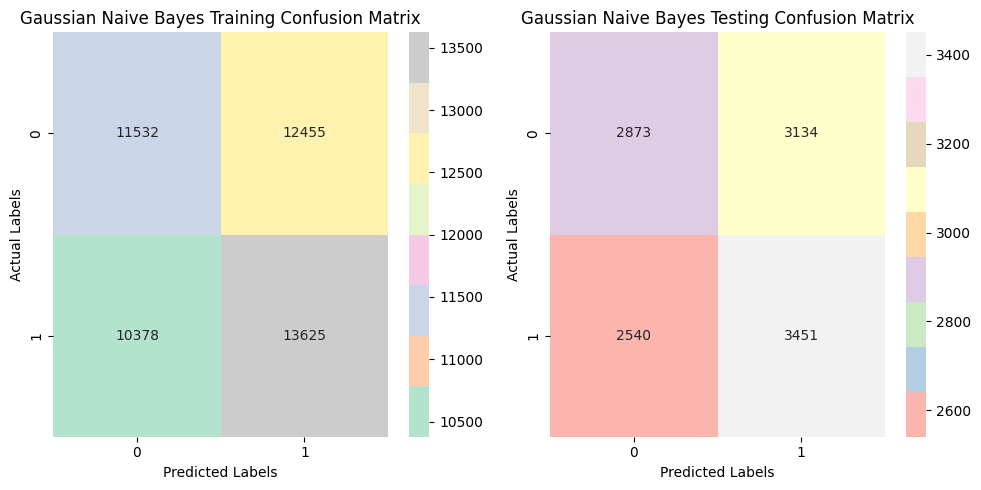

------------------------------------------------------------------------------------------------------
Train F1 Score is: 0.5440967993131403
Test F1 Score is: 0.5488231552162851
------------------------------------------------------------------------------------------------------
Gaussian Naive Bayes Training Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.48      0.50     23987
           1       0.52      0.57      0.54     24003

    accuracy                           0.52     47990
   macro avg       0.52      0.52      0.52     47990
weighted avg       0.52      0.52      0.52     47990

------------------------------------------------------------------------------------------------------
Gaussian Naive Bayes Testing Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.48      0.50      6007
           1       0.52      0.58      0.55      5991

    accuracy        

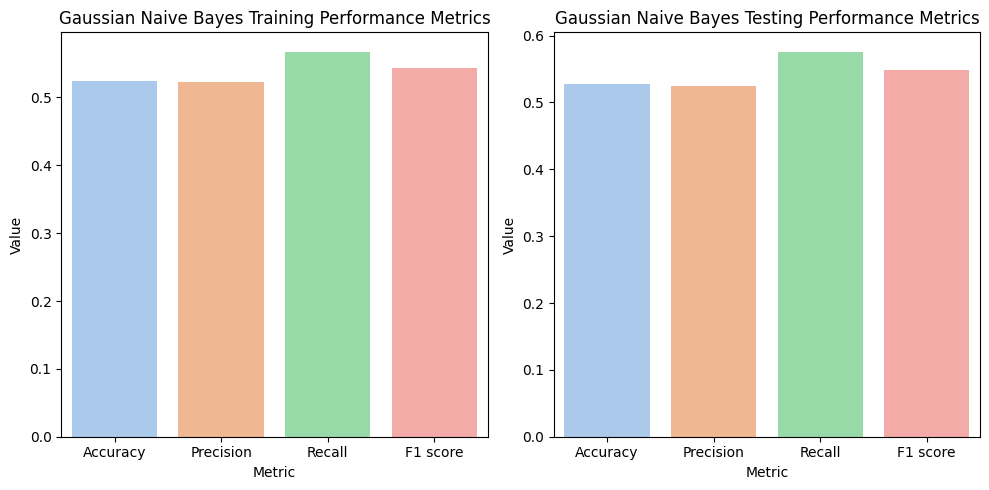

In [31]:
Classifiers("Gaussian Naive Bayes",x_train_pca, y_train, x_test_pca, y_test)


Random Forest
------------------------------------------------------------------------------------------------------
Cross_validation Accuracy for Random Forest :
 [0.71014795 0.73036049 0.71535737 0.73202751 0.72181705 0.72452594
 0.71994165 0.72744322 0.71639925 0.72306731]
------------------------------------------------------------------------------------------------------
Average bias: 0.000
Average variance: 0.250
------------------------------------------------------------------------------------------------------


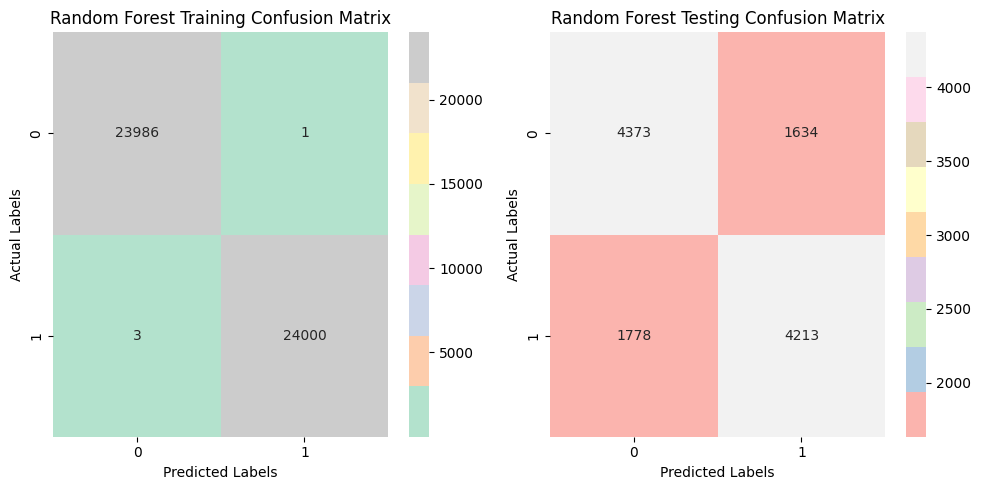

------------------------------------------------------------------------------------------------------
Train F1 Score is: 0.9999166736105325
Test F1 Score is: 0.7117756377766514
------------------------------------------------------------------------------------------------------
Random Forest Training Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     23987
           1       1.00      1.00      1.00     24003

    accuracy                           1.00     47990
   macro avg       1.00      1.00      1.00     47990
weighted avg       1.00      1.00      1.00     47990

------------------------------------------------------------------------------------------------------
Random Forest Testing Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.73      0.72      6007
           1       0.72      0.70      0.71      5991

    accuracy                      

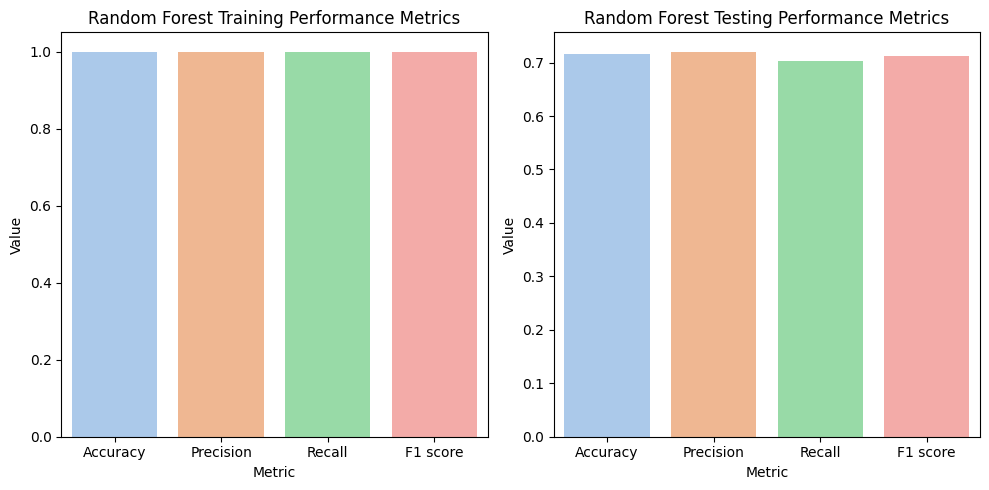

In [32]:
Classifiers("Random Forest",x_train_pca, y_train, x_test_pca, y_test)


Support Vector Machine SVM
------------------------------------------------------------------------------------------------------
Cross_validation Accuracy for Support Vector Machine SVM :
 [0.53511148 0.53240258 0.52344238 0.52573453 0.52886018 0.53427797
 0.53511148 0.53782038 0.53552824 0.53657012]
------------------------------------------------------------------------------------------------------
Average bias: 0.467
Average variance: 0.246
------------------------------------------------------------------------------------------------------


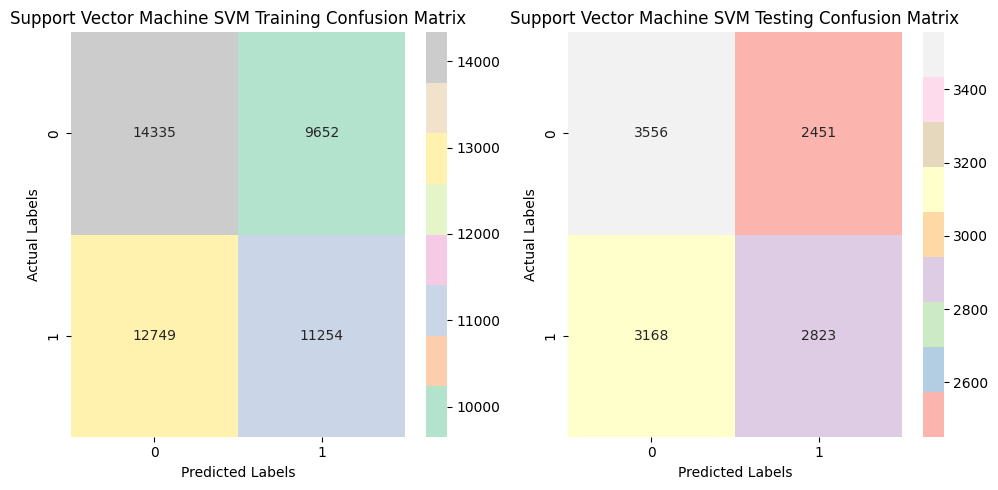

------------------------------------------------------------------------------------------------------
Train F1 Score is: 0.501191297958093
Test F1 Score is: 0.5011984021304927
------------------------------------------------------------------------------------------------------
Support Vector Machine SVM Training Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.60      0.56     23987
           1       0.54      0.47      0.50     24003

    accuracy                           0.53     47990
   macro avg       0.53      0.53      0.53     47990
weighted avg       0.53      0.53      0.53     47990

------------------------------------------------------------------------------------------------------
Support Vector Machine SVM Testing Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.59      0.56      6007
           1       0.54      0.47      0.50      5991

    accur

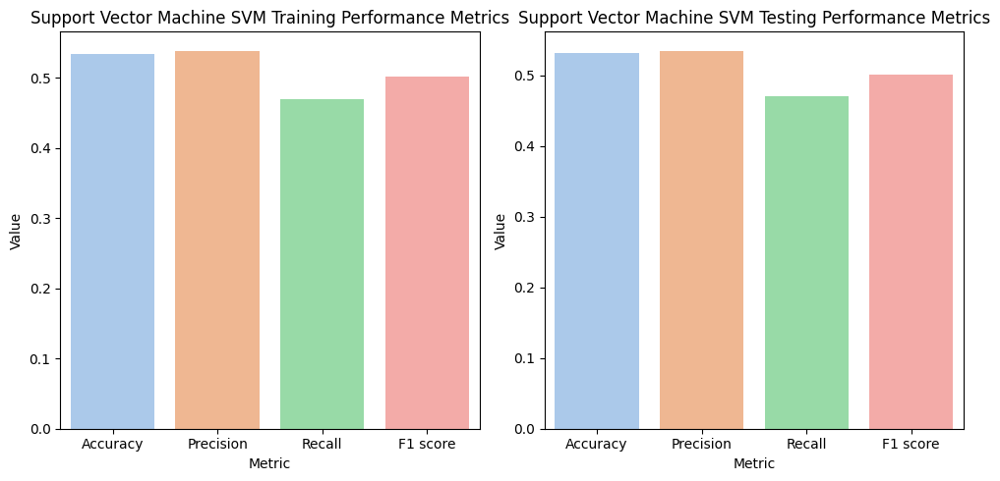

In [33]:
Classifiers("Support Vector Machine SVM",x_train_pca, y_train, x_test_pca, y_test)

Decision Tree Classifier
------------------------------------------------------------------------------------------------------
Cross_validation Accuracy for Decision Tree Classifier :
 [0.67264013 0.69285268 0.67868306 0.68701813 0.67389039 0.68410085
 0.68430923 0.67389039 0.6747239  0.67805793]
------------------------------------------------------------------------------------------------------
Average bias: 0.000
Average variance: 0.250
------------------------------------------------------------------------------------------------------


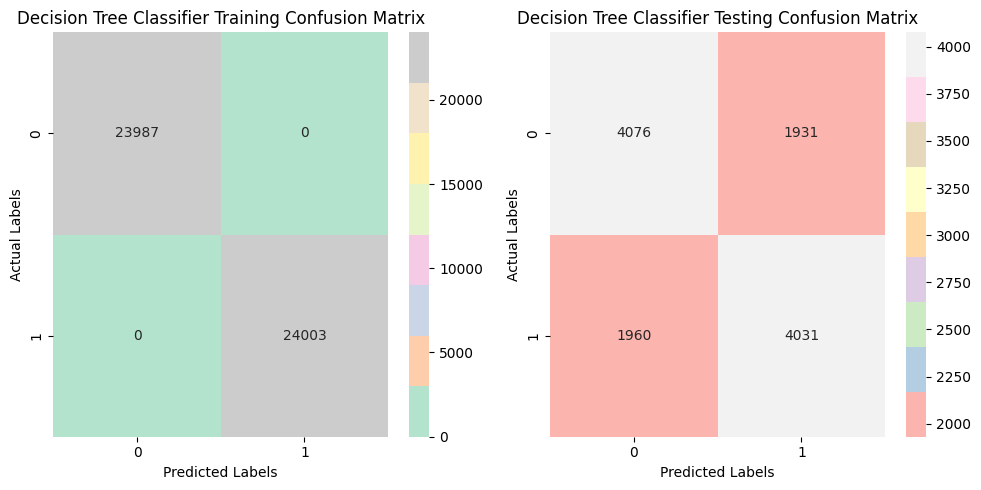

------------------------------------------------------------------------------------------------------
Train F1 Score is: 1.0
Test F1 Score is: 0.6744750271898269
------------------------------------------------------------------------------------------------------
Decision Tree Classifier Training Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     23987
           1       1.00      1.00      1.00     24003

    accuracy                           1.00     47990
   macro avg       1.00      1.00      1.00     47990
weighted avg       1.00      1.00      1.00     47990

------------------------------------------------------------------------------------------------------
Decision Tree Classifier Testing Classification Report:
              precision    recall  f1-score   support

           0       0.68      0.68      0.68      6007
           1       0.68      0.67      0.67      5991

    accuracy               

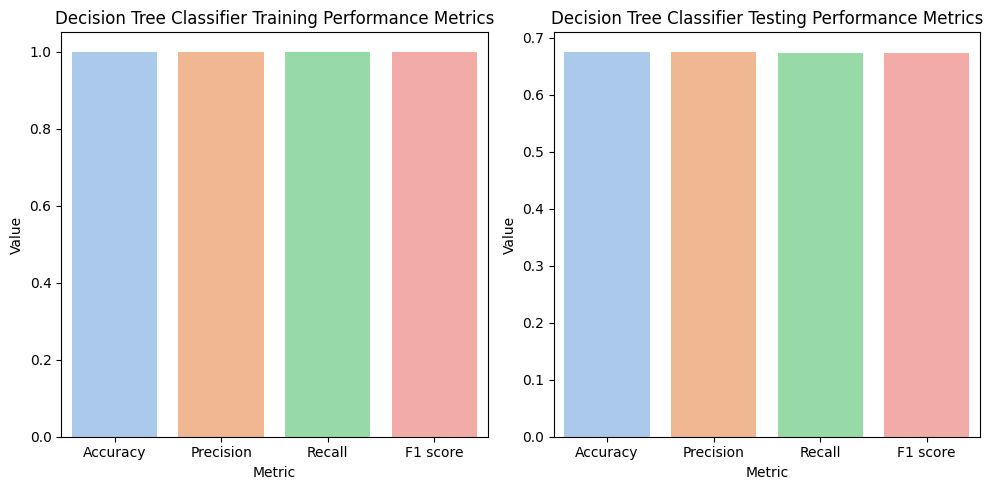

In [34]:
Classifiers("Decision Tree Classifier",x_train_pca, y_train, x_test_pca, y_test)

K Nearest Neighbors
------------------------------------------------------------------------------------------------------
Cross_validation Accuracy for K Nearest Neighbors :
 [0.68701813 0.70014586 0.69222755 0.69847885 0.69118566 0.70264638
 0.69368618 0.6953532  0.68201709 0.6988956 ]
------------------------------------------------------------------------------------------------------
Average bias: 0.143
Average variance: 0.229
------------------------------------------------------------------------------------------------------


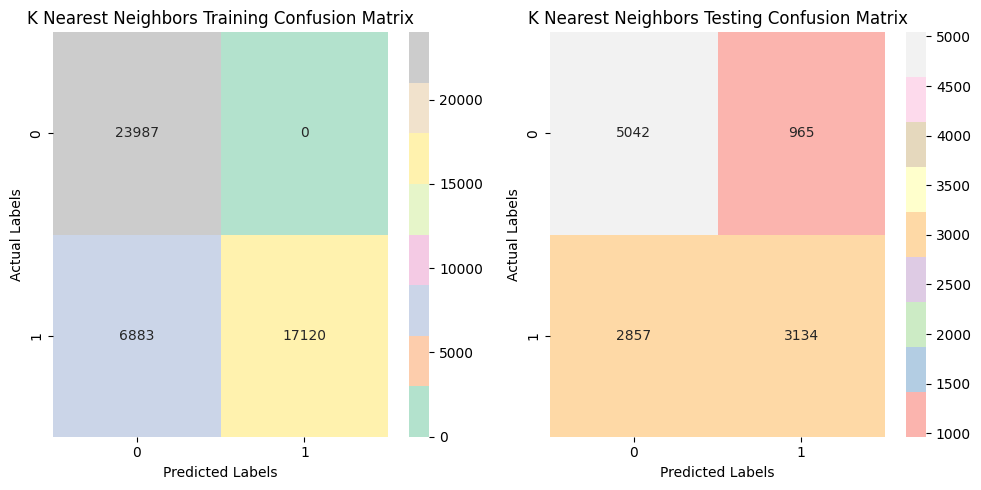

------------------------------------------------------------------------------------------------------
Train F1 Score is: 0.8326240789825645
Test F1 Score is: 0.621209117938553
------------------------------------------------------------------------------------------------------
K Nearest Neighbors Training Classification Report:
              precision    recall  f1-score   support

           0       0.78      1.00      0.87     23987
           1       1.00      0.71      0.83     24003

    accuracy                           0.86     47990
   macro avg       0.89      0.86      0.85     47990
weighted avg       0.89      0.86      0.85     47990

------------------------------------------------------------------------------------------------------
K Nearest Neighbors Testing Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.84      0.73      6007
           1       0.76      0.52      0.62      5991

    accuracy           

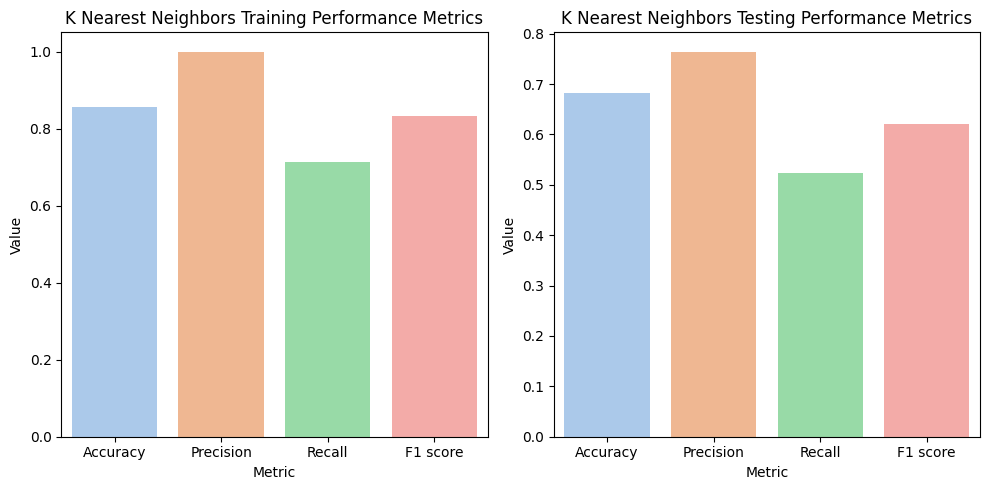

In [35]:
Classifiers("K Nearest Neighbors",x_train_pca, y_train, x_test_pca, y_test)

XGB Extreme X Gradient Boosting
------------------------------------------------------------------------------------------------------
Cross_validation Accuracy for XGB Extreme X Gradient Boosting :
 [0.68806001 0.70618879 0.69702021 0.70764743 0.69827047 0.70535528
 0.71139821 0.70723067 0.70056262 0.70410502]
------------------------------------------------------------------------------------------------------
Average bias: 0.243
Average variance: 0.250
------------------------------------------------------------------------------------------------------


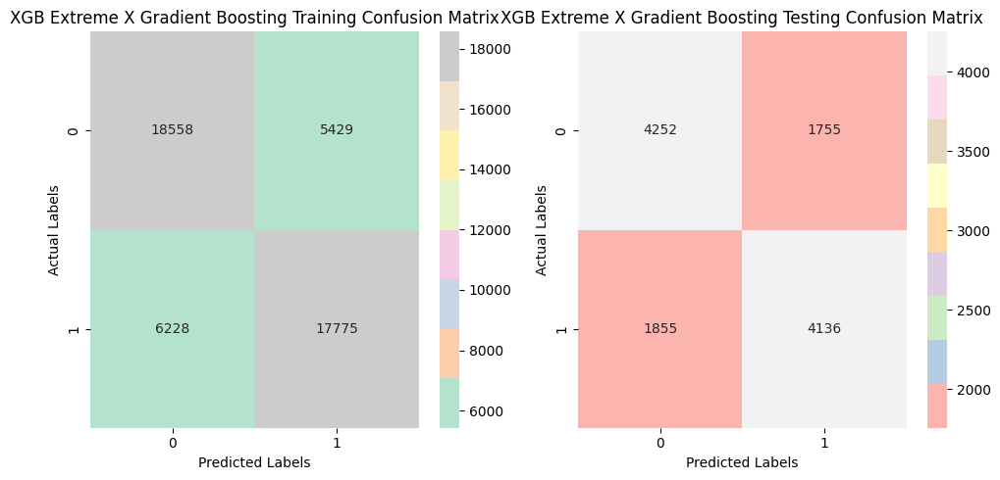

------------------------------------------------------------------------------------------------------
Train F1 Score is: 0.7530662825428431
Test F1 Score is: 0.6961790944285473
------------------------------------------------------------------------------------------------------
XGB Extreme X Gradient Boosting Training Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.77      0.76     23987
           1       0.77      0.74      0.75     24003

    accuracy                           0.76     47990
   macro avg       0.76      0.76      0.76     47990
weighted avg       0.76      0.76      0.76     47990

------------------------------------------------------------------------------------------------------
XGB Extreme X Gradient Boosting Testing Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.71      0.70      6007
           1       0.70      0.69      0.70      5991

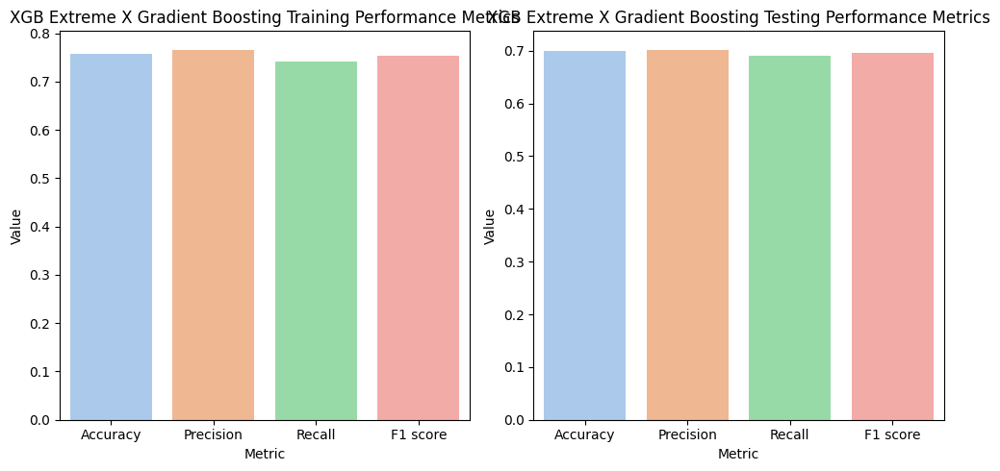

In [36]:
Classifiers("XGB Extreme X Gradient Boosting",x_train_pca, y_train, x_test_pca, y_test)

In [37]:
print("Champion Model:")
best_classifier = max(model_results, key=model_results.get)
best_clf = model_results[best_classifier]
print(best_classifier, best_clf)

Champion Model:
Random Forest 0.7117756377766514


In [38]:
sorted_Acc1 = sorted(model_results.items(), key = lambda x:x[1], reverse = True)
df = pd.DataFrame (sorted_Acc1, columns = ['Model','F1_score' ])
df.style.background_gradient(cmap='Blues')

,Model,F1_score
0,Random Forest,0.711776
1,XGB Extreme X Gradient Boosting,0.696179
2,Decision Tree Classifier,0.674475
3,K Nearest Neighbors,0.621209
4,Gaussian Naive Bayes,0.548823
5,Support Vector Machine SVM,0.501198


In [39]:
#Model Evlations
metrics_df = pd.DataFrame(classifiers_scorces, index=['Accuracy', 'Precision', 'Recall', 'F1 score']).T
metrics_df_sorted = metrics_df.sort_values(by='F1 score', ascending=False)
column_order = ['F1 score'] + [col for col in metrics_df_sorted.columns if col != 'F1 score']

# Then, reindex the DataFrame with the specified column order
metrics_df_sorted = metrics_df_sorted.reindex(columns=column_order)
metrics_df_sorted.style.background_gradient(cmap='Blues')

,F1 score,Accuracy,Precision,Recall
Random Forest,0.711776,0.715619,0.720540,0.703221
XGB Extreme X Gradient Boosting,0.696179,0.699117,0.702088,0.690369
Decision Tree Classifier,0.674475,0.675696,0.676115,0.672843
K Nearest Neighbors,0.621209,0.681447,0.764577,0.523118
Gaussian Naive Bayes,0.548823,0.527088,0.524070,0.576031
Support Vector Machine SVM,0.501198,0.531672,0.535267,0.471207


#Phase 4: Supervised Deep Learning Algorithms

## Deep Neural Networks

## sequential model in Keras: input Layer (No. of features ), 3 hidden layers including 10,8,6 unit & Output Layer with activation function relu/tanh

In [40]:
train_data, validation_data, train_targets, validation_targets = train_test_split(x_train, y_train, test_size=.2)

In [41]:
model = models.Sequential()

model.add(layers.Dense(10, input_shape=(x_train.shape[1],), activation='relu'))

model.add(layers.Dense(8, activation='relu'))

model.add(layers.Dense(6, activation='relu'))

model.add(layers.Dense(1, activation='sigmoid'))

In [42]:
#Compilation Step
model.compile(optimizer='rmsprop', loss='binary_crossentropy')

In [43]:
history = model.fit(x_train, y_train, epochs=100, batch_size=64)

Epoch 1/100
750/750 [==============================] - 6s 5ms/step - loss: 0.2679
Epoch 2/100
750/750 [==============================] - 3s 4ms/step - loss: 0.1003
Epoch 3/100
750/750 [==============================] - 3s 3ms/step - loss: 0.0745
Epoch 4/100
750/750 [==============================] - 3s 3ms/step - loss: 0.0617
Epoch 5/100
750/750 [==============================] - 3s 4ms/step - loss: 0.0550
Epoch 6/100
750/750 [==============================] - 4s 5ms/step - loss: 0.0505
Epoch 7/100
750/750 [==============================] - 3s 4ms/step - loss: 0.0469
Epoch 8/100
750/750 [==============================] - 3s 3ms/step - loss: 0.0441
Epoch 9/100
750/750 [==============================] - 3s 3ms/step - loss: 0.0421
Epoch 10/100
750/750 [==============================] - 3s 4ms/step - loss: 0.0403
Epoch 11/100
750/750 [==============================] - 4s 5ms/step - loss: 0.0390
Epoch 12/100
750/750 [==============================] - 3s 3ms/step - loss: 0.0374
Epoch 13/100


In [44]:
val_predictions = model.predict(x_test)
val_predictions

375/375 [==============================] - 1s 2ms/step


array([[3.6075164e-04],
       [1.1465829e-06],
       [1.0000000e+00],
       ...,
       [1.0000000e+00],
       [2.8273612e-03],
       [3.3407611e-07]], dtype=float32)

In [45]:
preds = np.around(val_predictions)
preds

array([[0.],
       [0.],
       [1.],
       ...,
       [1.],
       [0.],
       [0.]], dtype=float32)

In [46]:
print(classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      6007
           1       0.99      0.99      0.99      5991

    accuracy                           0.99     11998
   macro avg       0.99      0.99      0.99     11998
weighted avg       0.99      0.99      0.99     11998



In [47]:
#Precision is 1
test_preds = model.predict(x_test)
test_preds.shape

375/375 [==============================] - 1s 2ms/step


(11998, 1)

In [51]:
test_preds = test_preds.reshape(11998)
test_preds = np.round(test_preds)
print(classification_report(y_test, test_preds))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      6007
           1       0.99      0.99      0.99      5991

    accuracy                           0.99     11998
   macro avg       0.99      0.99      0.99     11998
weighted avg       0.99      0.99      0.99     11998



In [52]:
#How many correct predictions
output_df = pd.DataFrame({'Actual': y_test, 'Prediction': test_preds})
output_df.head()
output_df.shape

(11998, 2)

## CNN

In [53]:
#Reshaping the database into 3D
#We are using CNN for prediction so converting 2D dataset into 3D
x_train = x_train.to_numpy()
x_test = x_test.to_numpy()

In [54]:
x_train = x_train.reshape(x_train.shape[0],x_train.shape[1],1)
x_test = x_test.reshape(x_test.shape[0],x_test.shape[1],1)

x_train.shape, x_test.shape

((47990, 18, 1), (11998, 18, 1))

In [55]:

print(tf.__version__)
#Build CNN (Convolutional Neural Network)
# defining the hyperparameter
epochs = 45
model = Sequential()

# FIRST LAYER
model.add(Conv1D(32,2,activation = 'relu',input_shape = x_train[0].shape))
model.add(BatchNormalization())
'''Batch normalization is a technique for training very deep neural networks
   that standardizes the inputs to a layer for each mini-batch. This
   has the effect of stabilizing the learning process and dramatically
   reducing the number of training epochs required to train deep networks'''
model.add(Dropout(0.2)) # prevents over-fitting (randomly remove some neurons)

# SECOND LAYER
model.add(Conv1D(64,2,activation = 'relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))

# Flattening the layer ( multidimentional data into vector)
model.add(Flatten())
model.add(Dense(64,activation = 'relu'))
model.add(Dropout(0.5))

# FINAL LAYER
model.add(Dense(1,activation='sigmoid')) # binary classification

2.12.0


In [56]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 17, 32)            96        
                                                                 
 batch_normalization (BatchN  (None, 17, 32)           128       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 17, 32)            0         
                                                                 
 conv1d_1 (Conv1D)           (None, 16, 64)            4160      
                                                                 
 batch_normalization_1 (Batc  (None, 16, 64)           256       
 hNormalization)                                                 
                                                                 
 dropout_1 (Dropout)         (None, 16, 64)           

In [57]:
# optimizing the model
model.compile(optimizer = Adam(lr=0.0001),loss = 'binary_crossentropy',metrics=['accuracy'])

In [58]:
# Training the model, Calculating the accuracy
history = model.fit(x_train, y_train, epochs = epochs,
                    validation_data = (x_test,y_test),verbose = 1)

Epoch 1/45
1500/1500 [==============================] - 15s 8ms/step - loss: 0.1450 - accuracy: 0.9492 - val_loss: 0.0554 - val_accuracy: 0.9815
Epoch 2/45
1500/1500 [==============================] - 11s 8ms/step - loss: 0.0710 - accuracy: 0.9760 - val_loss: 0.0398 - val_accuracy: 0.9876
Epoch 3/45
1500/1500 [==============================] - 11s 7ms/step - loss: 0.0609 - accuracy: 0.9802 - val_loss: 0.0363 - val_accuracy: 0.9877
Epoch 4/45
1500/1500 [==============================] - 11s 7ms/step - loss: 0.0523 - accuracy: 0.9832 - val_loss: 0.0276 - val_accuracy: 0.9910
Epoch 5/45
1500/1500 [==============================] - 12s 8ms/step - loss: 0.0452 - accuracy: 0.9853 - val_loss: 0.0253 - val_accuracy: 0.9923
Epoch 6/45
1500/1500 [==============================] - 11s 7ms/step - loss: 0.0416 - accuracy: 0.9861 - val_loss: 0.0251 - val_accuracy: 0.9922
Epoch 7/45
1500/1500 [==============================] - 11s 7ms/step - loss: 0.0410 - accuracy: 0.9867 - val_loss: 0.0211 - val_ac

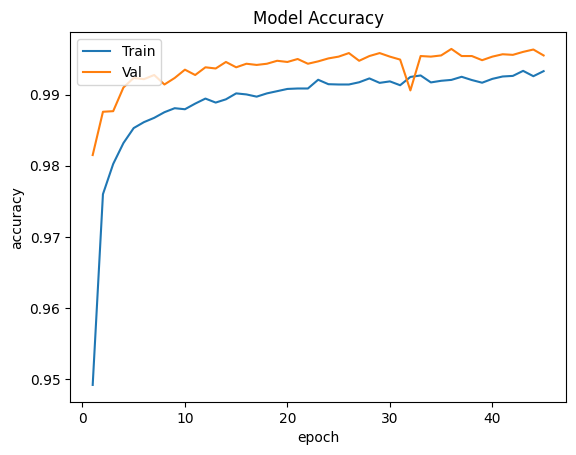

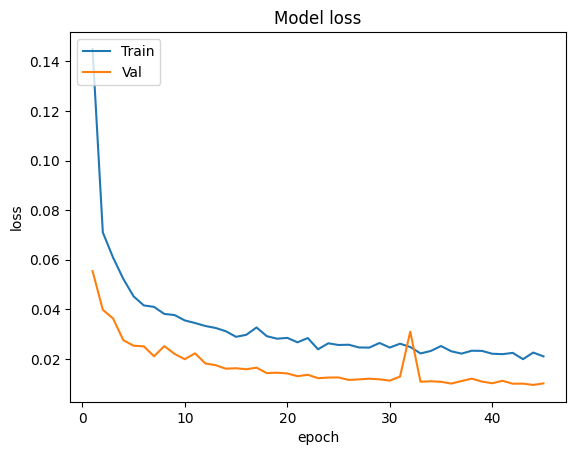

In [59]:
#Plotting a Learning Curve
def plot_learning_curve(history,epochs):

    # plot training and validation accuracy
    epoch_range = range(1,epochs+1)
    plt.plot(epoch_range,history.history['accuracy'])
    plt.plot(epoch_range,history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['Train','Val'],loc='upper left')
    plt.show()

    # plot training and validation loss
    plt.plot(epoch_range,history.history['loss'])
    plt.plot(epoch_range,history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['Train','Val'],loc='upper left')
    plt.show()
plot_learning_curve(history,epochs)

Adding MaxPool

Pooling layers are used to reduce the dimensions of the feature maps. Thus, it reduces the number of parameters to learn and the amount of computation performed in the network

In [60]:
# defining the hyperparameter
epochs = 100
model = Sequential()

# FIRST LAYER
model.add(Conv1D(64,2,activation = 'relu',input_shape = x_train[0].shape))
model.add(BatchNormalization())
'''Batch normalization is a technique for training very deep neural networks
   that standardizes the inputs to a layer for each mini-batch. This
   has the effect of stabilizing the learning process and dramatically
   reducing the number of training epochs required to train deep networks'''
model.add(MaxPool1D(2))
'''Max pooling is done to in part to help over-fitting by providing an abstracted form of the
   representation. As well, it reduces the computational cost by reducing the
   number of parameters to learn and provides basic translation invariance to
   the internal representation.'''
model.add(Dropout(0.2)) # prevents over-fitting (randomly remove some neurons)

# SECOND LAYER
model.add(Conv1D(128,2,activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPool1D(2))
model.add(Dropout(0.5))

# Flattening the layer ( multidimentional data into vector)
model.add(Flatten())
model.add(Dense(128,activation = 'relu'))
model.add(Dropout(0.5))

# FINAL LAYER
model.add(Dense(1,activation='sigmoid')) # binary classification

In [61]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_2 (Conv1D)           (None, 17, 64)            192       
                                                                 
 batch_normalization_2 (Batc  (None, 17, 64)           256       
 hNormalization)                                                 
                                                                 
 max_pooling1d (MaxPooling1D  (None, 8, 64)            0         
 )                                                               
                                                                 
 dropout_3 (Dropout)         (None, 8, 64)             0         
                                                                 
 conv1d_3 (Conv1D)           (None, 7, 128)            16512     
                                                                 
 batch_normalization_3 (Batc  (None, 7, 128)          

In [ ]:
# optimizing the model
model.compile(optimizer = Adam(lr=0.0001),loss = 'binary_crossentropy',metrics=['accuracy'])

# Training the model, Calculating the accuracy
history = model.fit(x_train, y_train, epochs = epochs,
                    validation_data = (x_test,y_test),verbose = 1)

Epoch 1/100
1500/1500 [==============================] - 15s 8ms/step - loss: 0.2358 - accuracy: 0.9135 - val_loss: 0.0790 - val_accuracy: 0.9750
Epoch 2/100
1500/1500 [==============================] - 12s 8ms/step - loss: 0.1184 - accuracy: 0.9583 - val_loss: 0.0615 - val_accuracy: 0.9803
Epoch 3/100
1500/1500 [==============================] - 12s 8ms/step - loss: 0.0975 - accuracy: 0.9673 - val_loss: 0.0606 - val_accuracy: 0.9804
Epoch 4/100
1500/1500 [==============================] - 11s 7ms/step - loss: 0.0819 - accuracy: 0.9724 - val_loss: 0.0470 - val_accuracy: 0.9857
Epoch 5/100
1500/1500 [==============================] - 10s 7ms/step - loss: 0.0772 - accuracy: 0.9752 - val_loss: 0.0444 - val_accuracy: 0.9852
Epoch 6/100
1500/1500 [==============================] - 12s 8ms/step - loss: 0.0687 - accuracy: 0.9772 - val_loss: 0.0412 - val_accuracy: 0.9864
Epoch 7/100
1500/1500 [==============================] - 12s 8ms/step - loss: 0.0648 - accuracy: 0.9784 - val_loss: 0.0453 -

In [ ]:
# plotting learning curve (MAX POOL)
plot_learning_curve(history,epochs)

In [ ]:
final_acc = model.evaluate(x_train,y_train)
final_acc

In [ ]:
pred = model.predict(x_test)
pred_label = pred.argmax(axis=1)

In [ ]:
# Calculate the confusion matrix for the test set
cm_test = confusion_matrix(y_test, pred.round())

# Visualize the confusion matrix using Seaborn
fig, axs = plt.subplots(ncols=1, figsize=(5, 5))
sns.heatmap(cm_test, annot=True, cmap='Pastel1', fmt='g')
plt.title("Testing Confusion Matrix")
plt.xlabel('Predicted Labels')
plt.ylabel('Actual Labels')
plt.tight_layout()
plt.show()

# Calculate the classification report
class_report = classification_report(y_test, pred.round())

# Display the full classification report with F1-Score for each class
print("Classification Report:")
print(class_report)